# Transfer Learning Strategies for Fine-Grained Imbalanced Waste Classification


In [1]:
# Uncomment the line below if imbalanced-learn is not installed:
# !pip install imbalanced-learn -q

import os
import random
from dataclasses import dataclass
from typing import Dict, Tuple, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, roc_auc_score
)

from imblearn.over_sampling import RandomOverSampler   # ← NEW for Experiment 3

print("TensorFlow:", tf.__version__)
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)


TensorFlow: 2.19.1
Num GPUs Available: 0


In [2]:
DATA_ROOT = os.path.abspath(os.path.join("..", "data", "RealWaste"))

assert os.path.isdir(DATA_ROOT), f"DATA_ROOT not found: {DATA_ROOT}"

IGNORE_DIRS = {"train", "test", "notebook", ".ipynb_checkpoints"}

class_names = sorted([
    d for d in os.listdir(DATA_ROOT)
    if os.path.isdir(os.path.join(DATA_ROOT, d))
    and d not in IGNORE_DIRS
    and len(d) > 0
    and d[0].isdigit()          
])

print("Classes:", class_names)
print("Num classes:", len(class_names))

assert len(class_names) == 9, f"Expected 9 classes, got {len(class_names)}: {class_names}"
for c in class_names:
    n = len([f for f in os.listdir(os.path.join(DATA_ROOT, c)) if not f.startswith(".")])
    print(f"{c}: {n} files")

Classes: ['1-Cardboard', '2-Food Organics', '3-Glass', '4-Metal', '5-Miscellaneous Trash', '6-Paper', '7-Plastic', '8-Textile Trash', '9-Vegetation']
Num classes: 9
1-Cardboard: 461 files
2-Food Organics: 411 files
3-Glass: 420 files
4-Metal: 790 files
5-Miscellaneous Trash: 495 files
6-Paper: 500 files
7-Plastic: 921 files
8-Textile Trash: 318 files
9-Vegetation: 436 files


In [3]:
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def is_image_file(p: str) -> bool:
    return os.path.splitext(p.lower())[1] in IMG_EXTS

paths = []
labels = []

class_to_idx = {c: i for i, c in enumerate(class_names)}

for c in class_names:
    folder = os.path.join(DATA_ROOT, c)
    for fn in os.listdir(folder):
        if fn.startswith("."):
            continue
        p = os.path.join(folder, fn)
        if os.path.isfile(p) and is_image_file(p):
            paths.append(p)
            labels.append(class_to_idx[c])

paths = np.array(paths)
labels = np.array(labels)

print("Total images:", len(paths))

X_trainval, X_test, y_trainval, y_test = train_test_split(
    paths, labels, test_size=0.20, random_state=SEED, stratify=labels
)

X_train, X_val, y_train, y_val = train_test_split(
    X_trainval, y_trainval, test_size=0.20, random_state=SEED, stratify=y_trainval
)

print(f"Train: {len(X_train)}  |  Val: {len(X_val)}  |  Test: {len(X_test)}")

def summarize_split(y, name, class_names=class_names):
    counts = np.bincount(y, minlength=len(class_names))
    df = pd.DataFrame({"class": class_names, "count": counts})
    df["pct"] = (df["count"] / df["count"].sum() * 100).round(2)
    imbalance_ratio = counts.max() / counts.min()
    print(f"\n{name} distribution  "
          f"(total={counts.sum()}, imbalance ratio={imbalance_ratio:.1f}x)")
    display(df)

summarize_split(y_train, "Original Train")
summarize_split(y_val,   "Val")
summarize_split(y_test,  "Test")


Total images: 4752
Train: 3040  |  Val: 761  |  Test: 951

Original Train distribution  (total=3040, imbalance ratio=2.9x)


,class,count,pct
0,1-Cardboard,295,9.70
1,2-Food Organics,263,8.65
2,3-Glass,269,8.85
3,4-Metal,505,16.61
4,5-Miscellaneous Trash,317,10.43
5,6-Paper,320,10.53
6,7-Plastic,589,19.38
7,8-Textile Trash,203,6.68
8,9-Vegetation,279,9.18



Val distribution  (total=761, imbalance ratio=2.9x)


,class,count,pct
0,1-Cardboard,74,9.72
1,2-Food Organics,66,8.67
2,3-Glass,67,8.80
3,4-Metal,127,16.69
4,5-Miscellaneous Trash,79,10.38
5,6-Paper,80,10.51
6,7-Plastic,147,19.32
7,8-Textile Trash,51,6.70
8,9-Vegetation,70,9.20



Test distribution  (total=951, imbalance ratio=2.9x)


,class,count,pct
0,1-Cardboard,92,9.67
1,2-Food Organics,82,8.62
2,3-Glass,84,8.83
3,4-Metal,158,16.61
4,5-Miscellaneous Trash,99,10.41
5,6-Paper,100,10.52
6,7-Plastic,185,19.45
7,8-Textile Trash,64,6.73
8,9-Vegetation,87,9.15


In [4]:
print("Num classes:", len(class_names))
print("Unique labels:", np.unique(labels))

Num classes: 9
Unique labels: [0 1 2 3 4 5 6 7 8]


## Oversampling

We apply `RandomOverSampler` to the **file-path array** of the training set.  
This duplicates images from minority classes until every class has the same count as the majority class.  
The val/test sets are left untouched so evaluation remains unbiased.

In [5]:
# ── Oversampling for Experiment 3 ─────────────────────────────────────────
print("=" * 55)
print("Applying RandomOverSampler to training file paths...")
print("=" * 55)

ros = RandomOverSampler(random_state=SEED)
# RandomOverSampler requires 2-D feature input → reshape path array, then flatten back
X_train_os, y_train_os = ros.fit_resample(X_train.reshape(-1, 1), y_train)
X_train_os = X_train_os.flatten()

print(f"\nOriginal train size : {len(X_train):>5d}")
print(f"Oversampled train   : {len(X_train_os):>5d}  "
      f"(+{len(X_train_os)-len(X_train)} synthetic duplicates)")

summarize_split(y_train_os, "Oversampled Train")


Applying RandomOverSampler to training file paths...

Original train size :  3040
Oversampled train   :  5301  (+2261 synthetic duplicates)

Oversampled Train distribution  (total=5301, imbalance ratio=1.0x)


,class,count,pct
0,1-Cardboard,589,11.11
1,2-Food Organics,589,11.11
2,3-Glass,589,11.11
3,4-Metal,589,11.11
4,5-Miscellaneous Trash,589,11.11
5,6-Paper,589,11.11
6,7-Plastic,589,11.11
7,8-Textile Trash,589,11.11
8,9-Vegetation,589,11.11


In [6]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 64
AUTOTUNE = tf.data.AUTOTUNE
NUM_CLASSES = len(class_names)

from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_preprocess

def load_and_preprocess(path: tf.Tensor, label: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_image(img_bytes, channels=3, expand_animations=False)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)
    img = vgg16_preprocess(img)
    label_oh = tf.one_hot(label, NUM_CLASSES)
    return img, label_oh

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal", seed=SEED),
        layers.RandomRotation(0.08, seed=SEED),
        layers.RandomZoom(0.15, seed=SEED),
        layers.RandomTranslation(0.08, 0.08, seed=SEED),
        layers.RandomContrast(0.10, seed=SEED),
    ],
    name="augmentation",
)

def make_dataset(X: np.ndarray, y: np.ndarray, training: bool) -> tf.data.Dataset:
    ds = tf.data.Dataset.from_tensor_slices((X, y))
    if training:
        ds = ds.shuffle(buffer_size=min(len(X), 2000), seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(load_and_preprocess, num_parallel_calls=AUTOTUNE)
    if training:
        ds = ds.map(lambda img, lab: (data_augmentation(img, training=True), lab), num_parallel_calls=AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(AUTOTUNE)
    return ds

# Exp 1 & 2: original (imbalanced) training set + class weights
train_ds = make_dataset(X_train,    y_train,    training=True)
val_ds   = make_dataset(X_val,      y_val,      training=False)
test_ds  = make_dataset(X_test,     y_test,     training=False)

# Exp 3: oversampled training set (no class weights needed)
train_ds_os = make_dataset(X_train_os, y_train_os, training=True)

print("train_ds   batches:", len(train_ds))
print("train_ds_os batches:", len(train_ds_os))
for xb, yb in train_ds.take(1):
    print("Batch X:", xb.shape, xb.dtype)
    print("Batch y:", yb.shape, yb.dtype)


train_ds   batches: 48
train_ds_os batches: 83
Batch X: (64, 224, 224, 3) <dtype: 'float32'>
Batch y: (64, 9) <dtype: 'float32'>


2026-03-31 16:33:53.150612: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [7]:
# ── Cost-Sensitive weights (used by Experiments 1 & 2 only) ──────────────
def compute_class_weights(y: np.ndarray) -> Dict[int, float]:
    counts = np.bincount(y, minlength=NUM_CLASSES)
    total = counts.sum()
    weights = {i: (total / (NUM_CLASSES * counts[i])) if counts[i] > 0 else 0.0
               for i in range(NUM_CLASSES)}
    return weights

class_weights = compute_class_weights(y_train)   # used by Exp 1 & 2
print("Class weights (Experiments 1 & 2):")
for i, w in class_weights.items():
    print(f"  {i:2d}  {class_names[i]:<35s}  weight = {w:.3f}")
print("\nNote: Experiment 3 uses Oversampling → class_weight=None")


Class weights (Experiments 1 & 2):
   0  1-Cardboard                          weight = 1.145
   1  2-Food Organics                      weight = 1.284
   2  3-Glass                              weight = 1.256
   3  4-Metal                              weight = 0.669
   4  5-Miscellaneous Trash                weight = 1.066
   5  6-Paper                              weight = 1.056
   6  7-Plastic                            weight = 0.573
   7  8-Textile Trash                      weight = 1.664
   8  9-Vegetation                         weight = 1.211

Note: Experiment 3 uses Oversampling → class_weight=None


In [8]:
def build_vgg16_model(
    train_base: bool = False,
    fine_tune_at: str = None,   
    lr: float = 1e-3
) -> keras.Model:
    base = keras.applications.VGG16(
        include_top=False,
        weights="imagenet",
        input_shape=(*IMG_SIZE, 3)
    )

    if not train_base:
        base.trainable = False
    else:
        base.trainable = True
        if fine_tune_at is not None:
            set_trainable = False
            for layer in base.layers:
                if layer.name == fine_tune_at:
                    set_trainable = True
                layer.trainable = set_trainable

    inputs = keras.Input(shape=(*IMG_SIZE, 3))
    x = base(inputs, training=False)  
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(512, activation="relu", kernel_regularizer=keras.regularizers.l2(1e-3))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

    model = keras.Model(inputs, outputs, name="VGG16_transfer")

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=lr),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    return model

In [9]:
@dataclass
class EvalResult:
    name: str
    accuracy: float
    precision_w: float
    recall_w: float
    f1_w: float
    f1_macro: float
    auc_ovr_w: float

def evaluate_model(model: keras.Model, X_paths: np.ndarray, y_true_int: np.ndarray, ds: tf.data.Dataset, name: str) -> Tuple[EvalResult, Dict]:
    # Predict probabilities
    y_prob = model.predict(ds, verbose=0)
    y_pred = np.argmax(y_prob, axis=1)

    acc = accuracy_score(y_true_int, y_pred)
    prec_w = precision_score(y_true_int, y_pred, average="weighted", zero_division=0)
    rec_w  = recall_score(y_true_int, y_pred, average="weighted", zero_division=0)
    f1_w   = f1_score(y_true_int, y_pred, average="weighted", zero_division=0)
    f1_mac = f1_score(y_true_int, y_pred, average="macro", zero_division=0)

    y_true_oh = tf.keras.utils.to_categorical(y_true_int, NUM_CLASSES)
    try:
        auc = roc_auc_score(y_true_oh, y_prob, multi_class="ovr", average="weighted")
    except ValueError:
        auc = float("nan")

    report = classification_report(y_true_int, y_pred, target_names=class_names, zero_division=0, output_dict=True)
    cm = confusion_matrix(y_true_int, y_pred)

    cm_off = cm.copy()
    np.fill_diagonal(cm_off, 0)
    conf_pairs = []
    for _ in range(10):
        i, j = np.unravel_index(np.argmax(cm_off), cm_off.shape)
        v = cm_off[i, j]
        if v == 0:
            break
        conf_pairs.append((class_names[i], class_names[j], int(v)))
        cm_off[i, j] = 0

    details = {
        "y_prob": y_prob,
        "y_pred": y_pred,
        "report": report,
        "cm": cm,
        "top_confusions": conf_pairs,
        "paths": X_paths,
        "y_true": y_true_int,
    }

    return EvalResult(name, acc, prec_w, rec_w, f1_w, f1_mac, auc), details

def plot_history(hist: keras.callbacks.History, title: str):
    h = hist.history
    fig = plt.figure(figsize=(10,4))
    plt.plot(h.get("accuracy", []), label="train_acc")
    plt.plot(h.get("val_accuracy", []), label="val_acc")
    plt.title(title + " — Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

    fig = plt.figure(figsize=(10,4))
    plt.plot(h.get("loss", []), label="train_loss")
    plt.plot(h.get("val_loss", []), label="val_loss")
    plt.title(title + " — Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_confusion_matrix(cm: np.ndarray, title: str):
    fig = plt.figure(figsize=(8,6))
    plt.imshow(cm)
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks(range(NUM_CLASSES), range(NUM_CLASSES), rotation=90)
    plt.yticks(range(NUM_CLASSES), range(NUM_CLASSES))
    plt.colorbar()
    plt.tight_layout()
    plt.show()


In [10]:
def plot_metric_comparison(results_list, metric, title=None):
    """Bar chart comparing a single metric across multiple experiments."""
    names  = [r.name for r in results_list]
    values = [getattr(r, metric) for r in results_list]
    colors = ["#4C72B0", "#DD8452", "#55A868"]
    fig, ax = plt.subplots(figsize=(8, 4))
    bars = ax.bar(names, values, color=colors[:len(names)], edgecolor="black", width=0.5)
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                f"{val:.4f}", ha="center", va="bottom", fontsize=10)
    ax.set_ylim(0, min(1.05, max(values) + 0.12))
    ax.set_ylabel(metric)
    ax.set_title(title or metric)
    ax.grid(axis="y", alpha=0.4)
    plt.tight_layout()
    plt.show()

def plot_all_comparisons(results_list):
    """Show comparison bar charts for all key metrics."""
    metrics = [
        ("accuracy",    "Test Accuracy"),
        ("f1_w",        "Weighted F1-Score"),
        ("f1_macro",    "Macro F1-Score  (reflects minority-class perf.)"),
        ("auc_ovr_w",   "Weighted AUC-ROC"),
    ]
    for metric, label in metrics:
        plot_metric_comparison(results_list, metric, title=label)


Epoch 1/8
48/48 ━━━━━━━━━━━━━━━━━━━━ 196s 4s/step - accuracy: 0.5424 - loss: 1.8964 - val_accuracy: 0.5598 - val_loss: 2.5029 - learning_rate: 0.0010
Epoch 2/8
48/48 ━━━━━━━━━━━━━━━━━━━━ 194s 4s/step - accuracy: 0.7220 - loss: 1.2789 - val_accuracy: 0.5966 - val_loss: 2.1029 - learning_rate: 0.0010
Epoch 3/8
48/48 ━━━━━━━━━━━━━━━━━━━━ 194s 4s/step - accuracy: 0.7803 - loss: 1.0855 - val_accuracy: 0.6176 - val_loss: 2.1399 - learning_rate: 0.0010
Epoch 4/8
48/48 ━━━━━━━━━━━━━━━━━━━━ 194s 4s/step - accuracy: 0.8135 - loss: 1.0147 - val_accuracy: 0.6229 - val_loss: 2.2177 - learning_rate: 0.0010
Epoch 5/8
48/48 ━━━━━━━━━━━━━━━━━━━━ 195s 4s/step - accuracy: 0.8365 - loss: 0.9220 - val_accuracy: 0.6452 - val_loss: 2.2205 - learning_rate: 0.0010
Epoch 6/8
48/48 ━━━━━━━━━━━━━━━━━━━━ 194s 4s/step - accuracy: 0.8766 - loss: 0.8079 - val_accuracy: 0.6675 - val_loss: 2.1661 - learning_rate: 5.0000e-04
Epoch 7/8
48/48 ━━━━━━━━━━━━━━━━━━━━ 194s 4s/step - accuracy: 0.8711 - loss: 0.7979 - val_accura

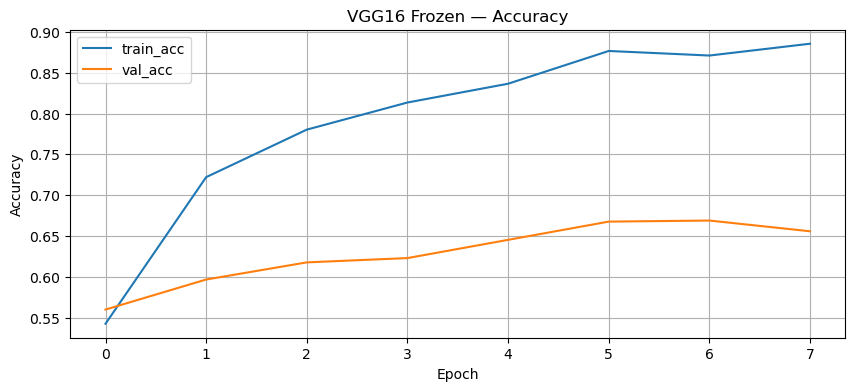

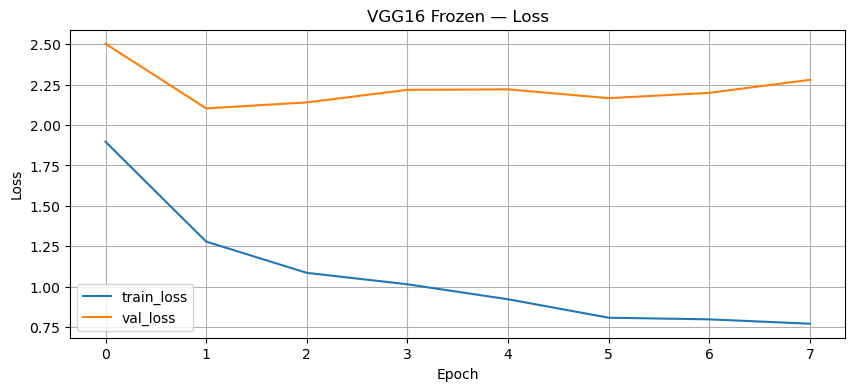

In [11]:
# Experiment 1: Frozen backbone (baseline)
EPOCHS_FROZEN = 8

frozen_model = build_vgg16_model(train_base=False, lr=1e-3)

callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-6),
]

hist_frozen = frozen_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_FROZEN,
    callbacks=callbacks,
    class_weight=class_weights
)

plot_history(hist_frozen, "VGG16 Frozen")


In [12]:
res_frozen, det_frozen = evaluate_model(frozen_model, X_test, y_test, test_ds, name="VGG16_Frozen")
res_frozen


EvalResult(name='VGG16_Frozen', accuracy=0.6056782334384858, precision_w=0.6547817660616955, recall_w=0.6056782334384858, f1_w=0.5966432219372859, f1_macro=0.5924350658305775, auc_ovr_w=0.9223711376052568)

In [13]:
print("Top confusions (True -> Pred, count):")
for t, p, n in det_frozen["top_confusions"]:
    print(f"  {t} -> {p}: {n}")

print("\nPer-class F1 (baseline):")
per_class_f1 = {k: v["f1-score"] for k, v in det_frozen["report"].items() if k in class_names}
pd.DataFrame({"class": list(per_class_f1.keys()), "f1": list(per_class_f1.values())}).sort_values("f1")


Top confusions (True -> Pred, count):
  9-Vegetation -> 2-Food Organics: 45
  4-Metal -> 3-Glass: 31
  4-Metal -> 7-Plastic: 25
  5-Miscellaneous Trash -> 2-Food Organics: 24
  6-Paper -> 1-Cardboard: 21
  4-Metal -> 8-Textile Trash: 18
  3-Glass -> 7-Plastic: 17
  5-Miscellaneous Trash -> 8-Textile Trash: 16
  7-Plastic -> 3-Glass: 15
  7-Plastic -> 4-Metal: 13

Per-class F1 (baseline):


,class,f1
4,5-Miscellaneous Trash,0.448718
3,4-Metal,0.491525
7,8-Textile Trash,0.560976
8,9-Vegetation,0.576000
2,3-Glass,0.581633
1,2-Food Organics,0.606557
0,1-Cardboard,0.676768
5,6-Paper,0.690000
6,7-Plastic,0.699739


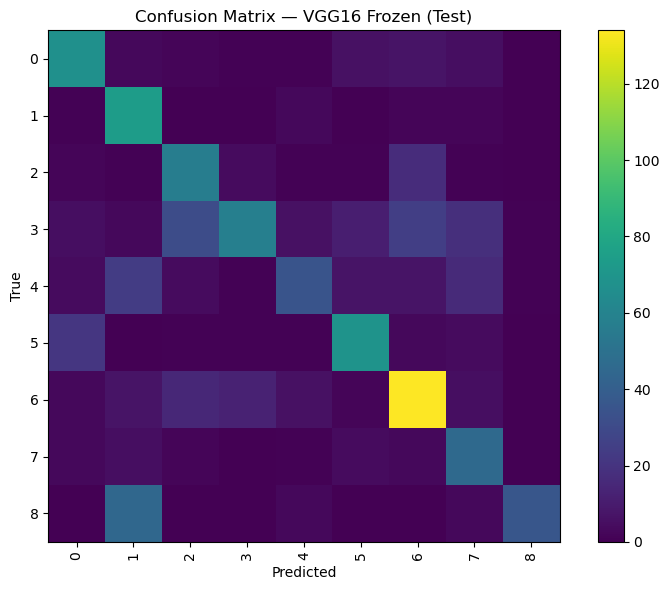

In [14]:
plot_confusion_matrix(det_frozen["cm"], "Confusion Matrix — VGG16 Frozen (Test)")


Epoch 1/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 227s 5s/step - accuracy: 0.4868 - loss: 2.0538 - val_accuracy: 0.3916 - val_loss: 3.9351 - learning_rate: 1.0000e-04
Epoch 2/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 231s 5s/step - accuracy: 0.7372 - loss: 1.2006 - val_accuracy: 0.4993 - val_loss: 3.3833 - learning_rate: 1.0000e-04
Epoch 3/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 226s 5s/step - accuracy: 0.8234 - loss: 0.9958 - val_accuracy: 0.5834 - val_loss: 2.6033 - learning_rate: 1.0000e-04
Epoch 4/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 226s 5s/step - accuracy: 0.8579 - loss: 0.8808 - val_accuracy: 0.6531 - val_loss: 2.1225 - learning_rate: 1.0000e-04
Epoch 5/5
48/48 ━━━━━━━━━━━━━━━━━━━━ 226s 5s/step - accuracy: 0.8855 - loss: 0.8178 - val_accuracy: 0.6781 - val_loss: 1.9521 - learning_rate: 1.0000e-04


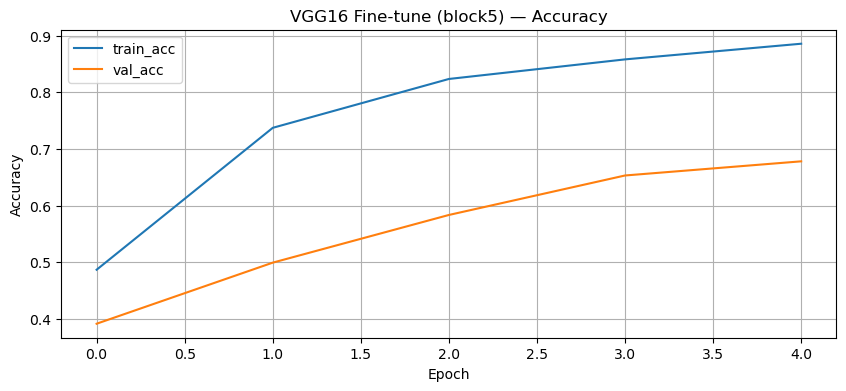

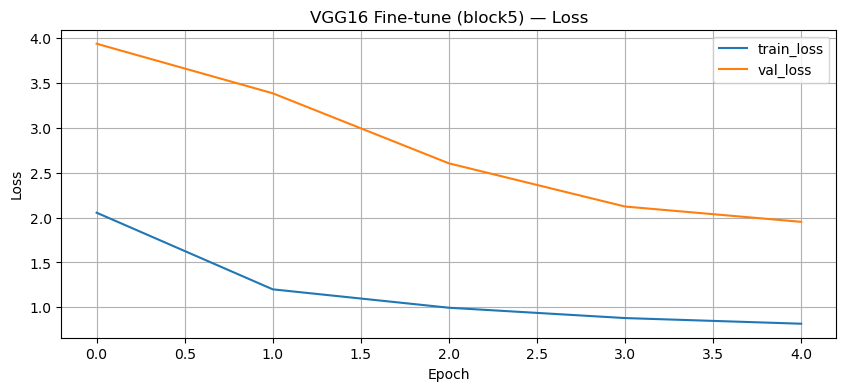

In [15]:
# Experiment 2: Fine-tune last conv block (block5)
EPOCHS_FINETUNE = 5

finetune_model = build_vgg16_model(train_base=True, fine_tune_at="block5_conv1", lr=1e-4)

callbacks_ft = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-6),
]

hist_ft = finetune_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_FINETUNE,
    callbacks=callbacks_ft,
    class_weight=class_weights
)

plot_history(hist_ft, "VGG16 Fine-tune (block5)")


In [16]:
# Evaluate fine-tuned model on TEST
res_ft, det_ft = evaluate_model(finetune_model, X_test, y_test, test_ds, name="VGG16_FineTune_block5")
res_ft


EvalResult(name='VGG16_FineTune_block5', accuracy=0.6992639327024185, precision_w=0.722293507403375, recall_w=0.6992639327024185, f1_w=0.6965713602395011, f1_macro=0.695276334294561, auc_ovr_w=0.9464814770636942)

Top confusions (fine-tune) (True -> Pred, count):
  7-Plastic -> 4-Metal: 27
  6-Paper -> 1-Cardboard: 26
  2-Food Organics -> 9-Vegetation: 18
  7-Plastic -> 3-Glass: 17
  5-Miscellaneous Trash -> 8-Textile Trash: 16
  4-Metal -> 6-Paper: 13
  7-Plastic -> 1-Cardboard: 11
  5-Miscellaneous Trash -> 9-Vegetation: 10
  5-Miscellaneous Trash -> 1-Cardboard: 9
  3-Glass -> 1-Cardboard: 8


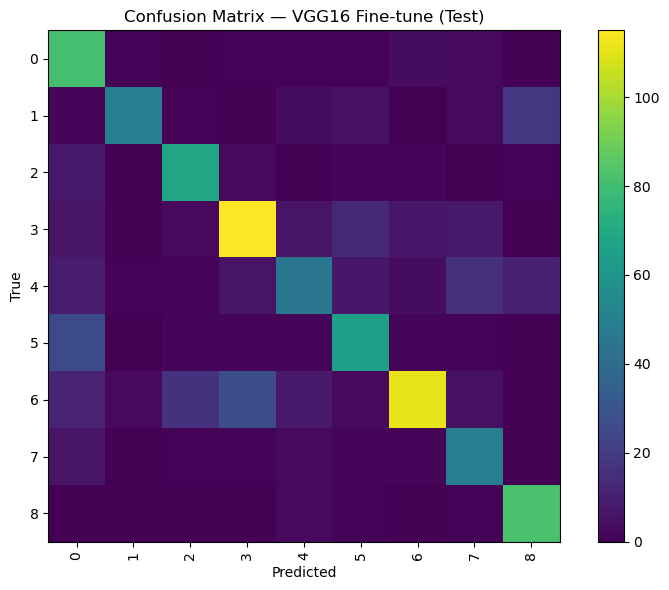

In [17]:
print("Top confusions (fine-tune) (True -> Pred, count):")
for t, p, n in det_ft["top_confusions"]:
    print(f"  {t} -> {p}: {n}")

plot_confusion_matrix(det_ft["cm"], "Confusion Matrix — VGG16 Fine-tune (Test)")


---
## Experiment 3 — Fine-tune VGG16 block5 + Oversampling

Epoch 1/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 367s 4s/step - accuracy: 0.6244 - loss: 1.6887 - val_accuracy: 0.4231 - val_loss: 3.8549 - learning_rate: 1.0000e-04
Epoch 2/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 366s 4s/step - accuracy: 0.8212 - loss: 1.0398 - val_accuracy: 0.6229 - val_loss: 2.1343 - learning_rate: 1.0000e-04
Epoch 3/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 366s 4s/step - accuracy: 0.8866 - loss: 0.8494 - val_accuracy: 0.6347 - val_loss: 2.0420 - learning_rate: 1.0000e-04
Epoch 4/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 370s 4s/step - accuracy: 0.9261 - loss: 0.7437 - val_accuracy: 0.6334 - val_loss: 2.1919 - learning_rate: 1.0000e-04
Epoch 5/5
83/83 ━━━━━━━━━━━━━━━━━━━━ 366s 4s/step - accuracy: 0.9370 - loss: 0.6938 - val_accuracy: 0.6689 - val_loss: 1.8552 - learning_rate: 1.0000e-04


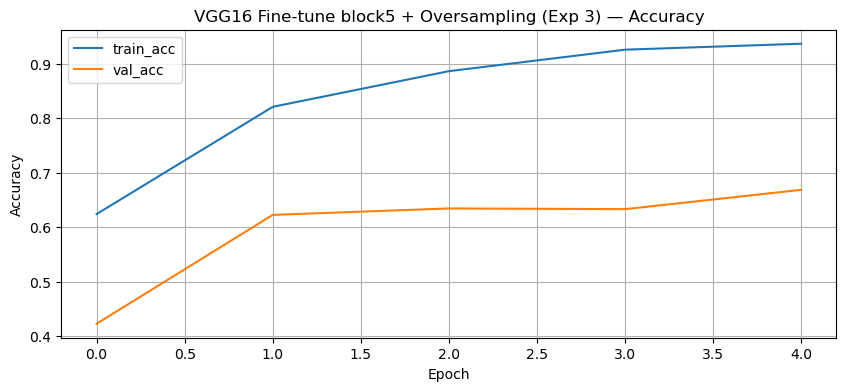

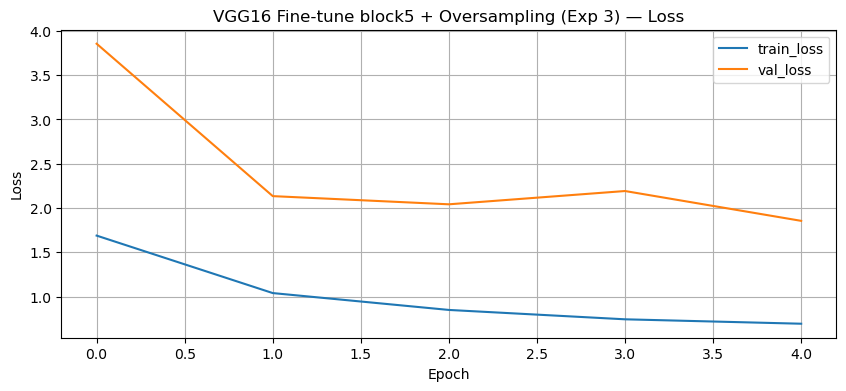

In [ ]:
# ── Experiment 3: Fine-tune block5  +  Oversampling  +  no class weights ─
EPOCHS_OS = 5

os_model = build_vgg16_model(train_base=True, fine_tune_at="block5_conv1", lr=1e-4)

callbacks_os = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-6),
]

hist_os = os_model.fit(
    train_ds_os,          # oversampled, balanced training data
    validation_data=val_ds,
    epochs=EPOCHS_OS,
    callbacks=callbacks_os,
    class_weight=None     # NOT using cost-sensitive weights
)

plot_history(hist_os, "VGG16 Fine-tune block5 + Oversampling (Exp 3)")


In [19]:
# Evaluate Experiment 3 on the held-out test set
res_os, det_os = evaluate_model(
    os_model, X_test, y_test, test_ds,
    name="VGG16_FineTune_Oversample"
)
res_os


EvalResult(name='VGG16_FineTune_Oversample', accuracy=0.6698212407991588, precision_w=0.7173685727385734, recall_w=0.6698212407991588, f1_w=0.6652192616032482, f1_macro=0.6769984589499256, auc_ovr_w=0.9452724781698479)

Top confusions (Exp 3 — Oversampling) (True -> Pred, count):
  7-Plastic -> 5-Miscellaneous Trash: 35
  7-Plastic -> 3-Glass: 27
  4-Metal -> 8-Textile Trash: 24
  4-Metal -> 3-Glass: 21
  2-Food Organics -> 5-Miscellaneous Trash: 16
  4-Metal -> 6-Paper: 16
  4-Metal -> 7-Plastic: 16
  5-Miscellaneous Trash -> 6-Paper: 13
  2-Food Organics -> 9-Vegetation: 11
  5-Miscellaneous Trash -> 9-Vegetation: 11

Per-class F1 (Experiment 3 — Oversampling):


,class,f1_exp3_oversampling
4,5-Miscellaneous Trash,0.508772
3,4-Metal,0.582278
6,7-Plastic,0.636066
7,8-Textile Trash,0.646341
2,3-Glass,0.691589
1,2-Food Organics,0.704225
5,6-Paper,0.713043
0,1-Cardboard,0.788889
8,9-Vegetation,0.821782


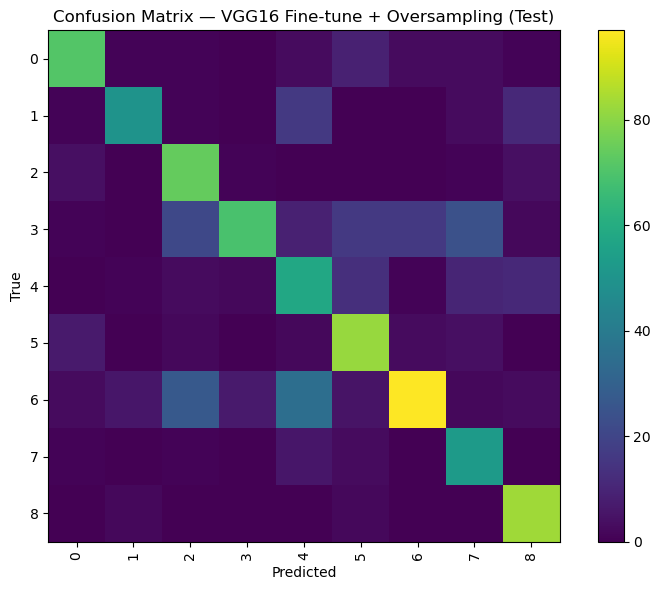

In [20]:
print("Top confusions (Exp 3 — Oversampling) (True -> Pred, count):")
for t, p, n in det_os["top_confusions"]:
    print(f"  {t} -> {p}: {n}")

print("\nPer-class F1 (Experiment 3 — Oversampling):")
per_class_f1_os = {
    k: v["f1-score"]
    for k, v in det_os["report"].items() if k in class_names
}
df_f1_os = pd.DataFrame({
    "class": list(per_class_f1_os.keys()),
    "f1_exp3_oversampling": list(per_class_f1_os.values())
}).sort_values("f1_exp3_oversampling")
display(df_f1_os)

plot_confusion_matrix(det_os["cm"], "Confusion Matrix — VGG16 Fine-tune + Oversampling (Test)")


---
## Final Comparison — All Three Experiments

Summary table + bar charts comparing all three strategies side-by-side.


ABLATION STUDY — RealWaste VGG16, Imbalanced-Data Handling Strategies


,Experiment,Imbalance Strategy,Accuracy,Weighted F1,Macro F1,Weighted AUC,Weighted Precision,Weighted Recall
0,VGG16_Frozen,Cost-Sensitive (Class Weights),0.6057,0.5966,0.5924,0.9224,0.6548,0.6057
1,VGG16_FineTune_block5,Cost-Sensitive (Class Weights),0.6993,0.6966,0.6953,0.9465,0.7223,0.6993
2,VGG16_FineTune_Oversample,Oversampling (RandomOverSampler),0.6698,0.6652,0.6770,0.9453,0.7174,0.6698



Per-class F1 comparison across all experiments:


,VGG16_Frozen,VGG16_FineTune_block5,VGG16_FineTune_Oversample
Class,,,
1-Cardboard,0.6768,0.6722,0.7889
2-Food Organics,0.6066,0.7206,0.7042
3-Glass,0.5816,0.7684,0.6916
4-Metal,0.4915,0.7348,0.5823
5-Miscellaneous Trash,0.4487,0.5263,0.5088
6-Paper,0.6900,0.6533,0.7130
7-Plastic,0.6997,0.7003,0.6361
8-Textile Trash,0.5610,0.6533,0.6463
9-Vegetation,0.5760,0.8283,0.8218


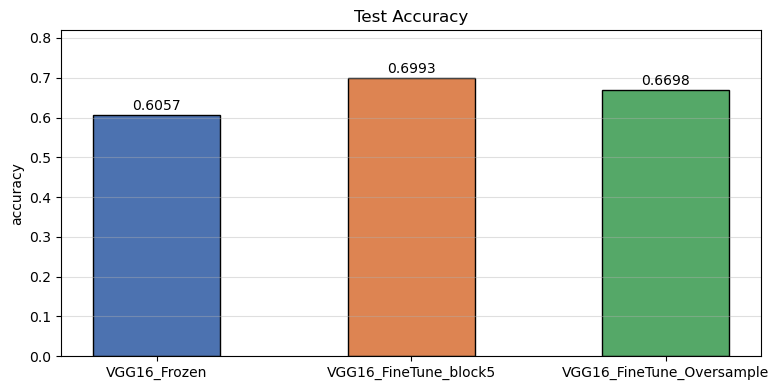

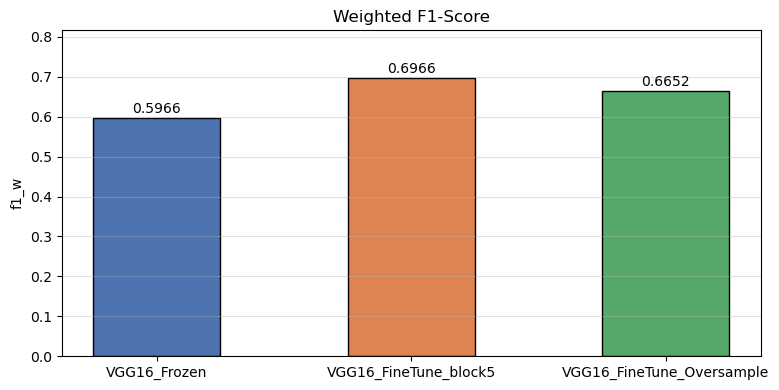

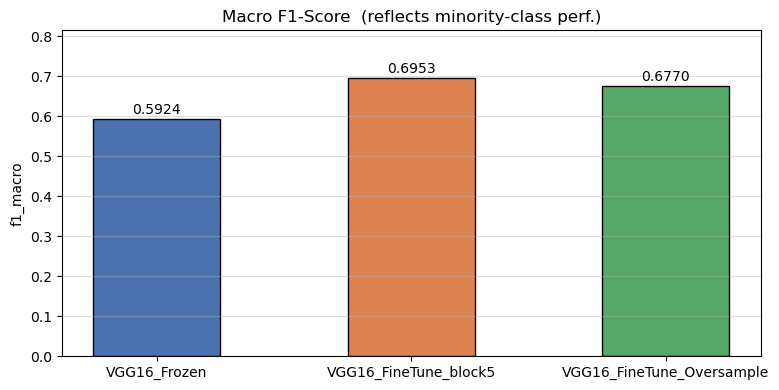

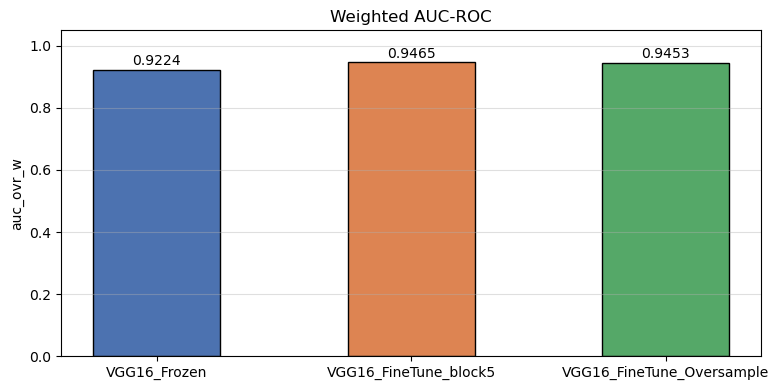

In [ ]:
# ── Summary table ───
all_results = [res_frozen, res_ft, res_os]

results_df = pd.DataFrame([
    {
        "Experiment":       r.name,
        "Imbalance Strategy": strat,
        "Accuracy":         round(r.accuracy,    4),
        "Weighted F1":      round(r.f1_w,        4),
        "Macro F1":         round(r.f1_macro,    4),
        "Weighted AUC":     round(r.auc_ovr_w,   4),
        "Weighted Precision": round(r.precision_w, 4),
        "Weighted Recall":  round(r.recall_w,    4),
    }
    for r, strat in zip(
        all_results,
        ["Cost-Sensitive (Class Weights)",
         "Cost-Sensitive (Class Weights)",
         "Oversampling (RandomOverSampler)"]
    )
])

print("=" * 90)
print("ABLATION STUDY — RealWaste VGG16, Imbalanced-Data Handling Strategies")
print("=" * 90)
display(results_df)

# ── Per-class F1 comparison (minority classes highlighted) ─────────────────
print("\nPer-class F1 comparison across all experiments:")
f1_data = {}
for r, det in [(res_frozen, det_frozen), (res_ft, det_ft), (res_os, det_os)]:
    f1_data[r.name] = {
        k: round(v["f1-score"], 4)
        for k, v in det["report"].items() if k in class_names
    }
f1_compare_df = pd.DataFrame(f1_data).rename_axis("Class")
display(f1_compare_df)

# ── Bar charts ─────────────────────────────────────────────────────────────
plot_all_comparisons(all_results)


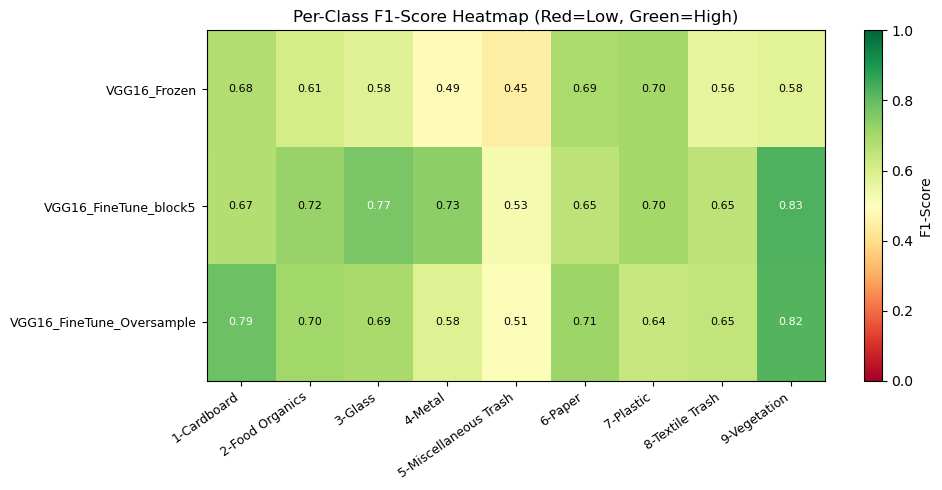


Tip: Green cells show classes where the strategy performed well.
     Compare row 3 (Oversampling) vs rows 1-2 (Cost-Sensitive)
     especially for minority classes (Textile, Organic).


In [22]:
# ── Per-class F1 heatmap: easy to spot which strategy helps minority classes ─
import matplotlib.colors as mcolors

fig, ax = plt.subplots(figsize=(10, 5))
im = ax.imshow(f1_compare_df.values.T, aspect="auto", cmap="RdYlGn", vmin=0, vmax=1)

ax.set_xticks(range(len(class_names)))
ax.set_xticklabels(class_names, rotation=35, ha="right", fontsize=9)
ax.set_yticks(range(len(f1_compare_df.columns)))
ax.set_yticklabels(f1_compare_df.columns, fontsize=9)
ax.set_title("Per-Class F1-Score Heatmap (Red=Low, Green=High)", fontsize=12)

for yi, exp_name in enumerate(f1_compare_df.columns):
    for xi, cls in enumerate(class_names):
        val = f1_compare_df.loc[cls, exp_name]
        ax.text(xi, yi, f"{val:.2f}", ha="center", va="center", fontsize=8,
                color="black" if 0.3 < val < 0.75 else "white")

plt.colorbar(im, ax=ax, label="F1-Score")
plt.tight_layout()
plt.show()
print("\nTip: Green cells show classes where the strategy performed well.\n"
      "     Compare row 3 (Oversampling) vs rows 1-2 (Cost-Sensitive)\n"
      "     especially for minority classes (Textile, Organic).")


Exp 1 — Frozen + Cost-Sensitive: misclassified examples


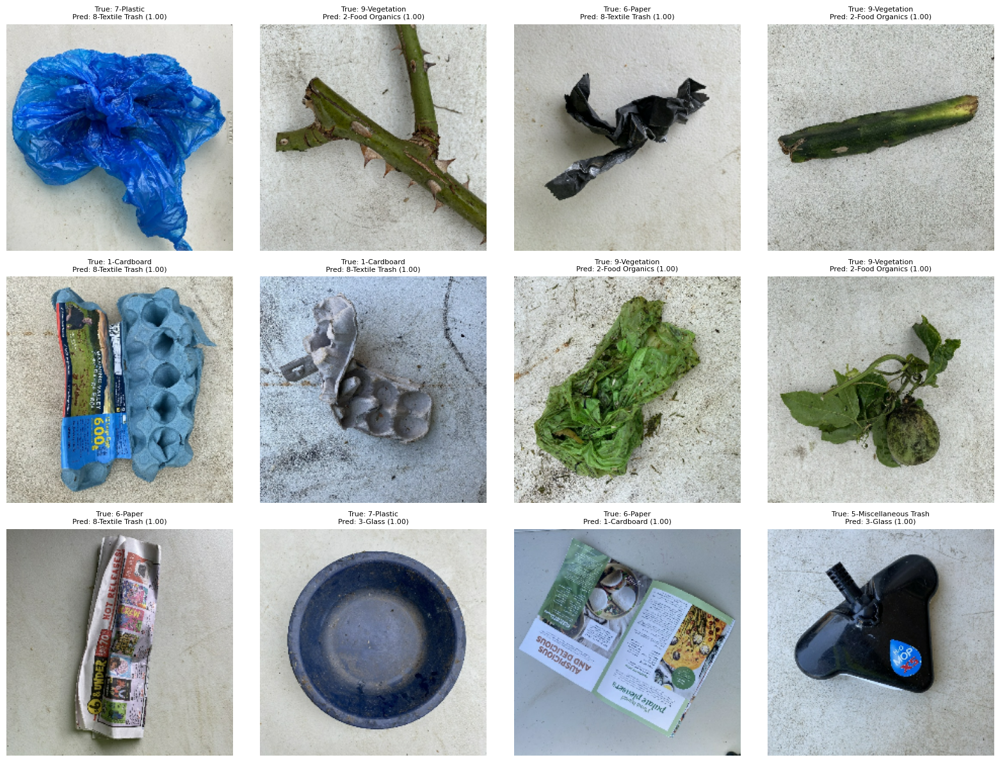

Exp 2 — Fine-tune + Cost-Sensitive: misclassified examples


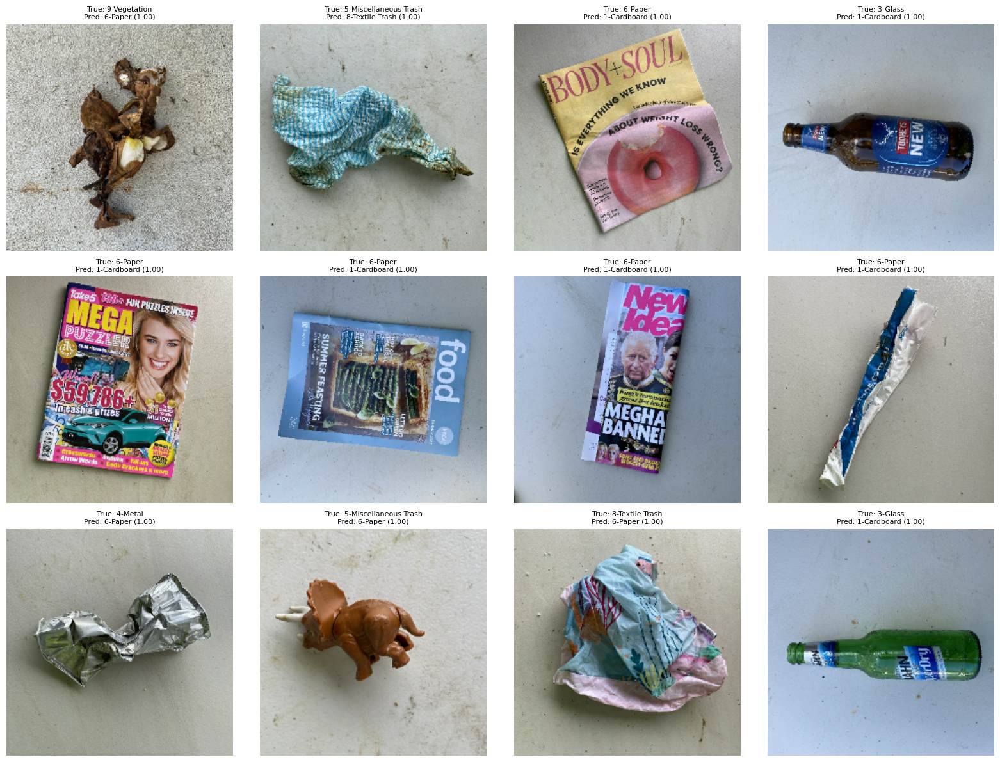

Exp 3 — Fine-tune + Oversampling: misclassified examples


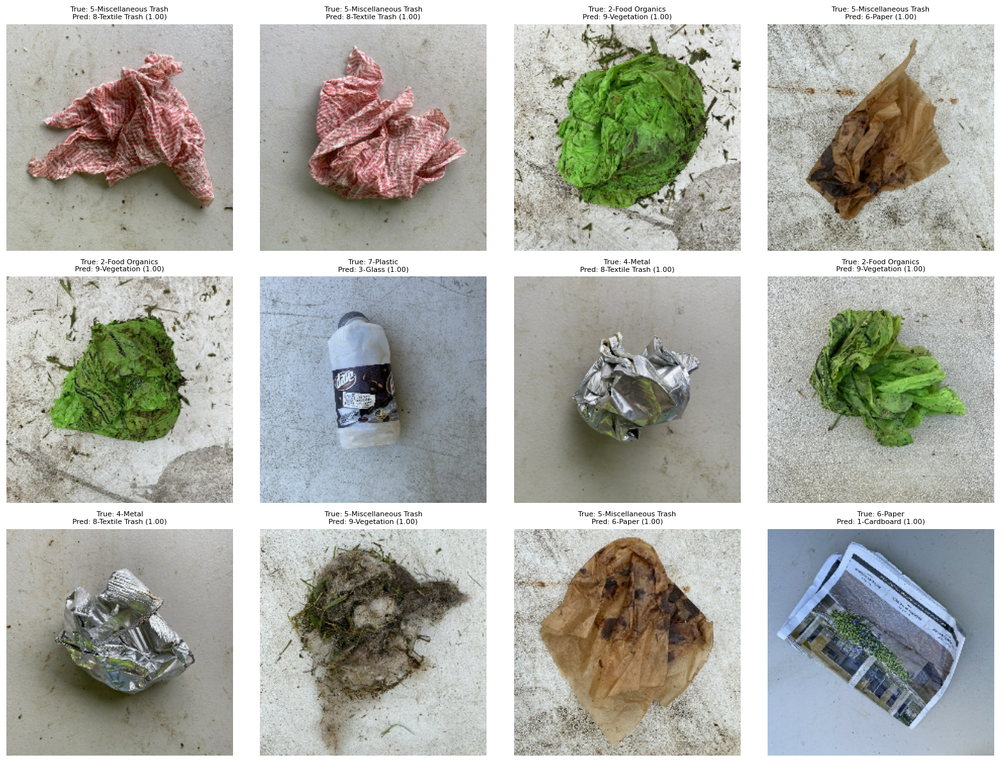

In [23]:
# Failure-mode analysis: visualize misclassified examples
def show_misclassified(details: Dict, k: int = 12):
    y_true = details["y_true"]
    y_pred = details["y_pred"]
    y_prob = details["y_prob"]
    paths  = details["paths"]

    wrong = np.where(y_true != y_pred)[0]
    if len(wrong) == 0:
        print("No misclassifications found.")
        return

    conf  = y_prob[wrong, y_pred[wrong]]
    order = wrong[np.argsort(-conf)]
    pick  = order[:k]

    cols = 4
    rows = int(np.ceil(k / cols))
    plt.figure(figsize=(4 * cols, 4 * rows))

    for i, idx in enumerate(pick):
        p = paths[idx]
        img_bytes = tf.io.read_file(p)
        img = tf.image.decode_image(img_bytes, channels=3, expand_animations=False)
        img = tf.image.resize(img, IMG_SIZE)
        img = tf.cast(img, tf.uint8).numpy()

        true_name = class_names[y_true[idx]]
        pred_name = class_names[y_pred[idx]]
        pred_prob = float(y_prob[idx, y_pred[idx]])

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(f"True: {true_name}\nPred: {pred_name} ({pred_prob:.2f})", fontsize=8)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

print("=" * 50)
print("Exp 1 — Frozen + Cost-Sensitive: misclassified examples")
print("=" * 50)
show_misclassified(det_frozen, k=12)

print("=" * 50)
print("Exp 2 — Fine-tune + Cost-Sensitive: misclassified examples")
print("=" * 50)
show_misclassified(det_ft, k=12)

print("=" * 50)
print("Exp 3 — Fine-tune + Oversampling: misclassified examples")
print("=" * 50)
show_misclassified(det_os, k=12)
